# Neural Style Transder (NST)

## Introduction
Neural Style Transfer (NST) is a fascinating application of deep learning that combines the content of one image with the style of another. This technique has gained popularity for creating artistic and visually appealing images. In this project, we will explore the implementation of NST using the VGG-19 model.

## **Overview**
NST leverages the representations learned by CNNs to recombine content and style from different images. We define a content loss and a style loss, which are minimized to generate a new image that preserves the content of one image and the style of another.

Definitions:
*   Content (C) — our original image which we want to adapted to a given artistic style
*   Style (S) — the image whose artistic style we want to adapt
*   An input (generated) image (G) — the final result *(each pixel in it is a trainable variable)*


## **Importing Libraries:**

In [4]:
%matplotlib inline

import requests

from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
from torchvision import transforms, models

## **Downloading a Pre-trained VGG19 model**
Here I am using the pre-trained VGG19 model. The model is trained on ImageNet images. And freezing the parameters.

In [5]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False) # Freeze the weights of VGG-19

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:09<00:00, 62.6MB/s]


In [8]:
# VGG-19 architecture
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## **Custom functions:**

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

Using: cuda


In [9]:
def load_image(img_path, max_size=400, shape=None):
    image=Image.open(img_path)
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

In [12]:
def convert_image(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [13]:
def get_features(image, model, layers=None):

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '28': 'conv5_1',
                  '30': 'conv5_4', # for getting image encodngs of content and generated image
                  }

    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features

In [14]:
def gram_matrix(tensor):

    _, d, h, w = tensor.size()

    tensor = tensor.view(d, h * w)

    gram = torch.mm(tensor, tensor.t())

    return gram

### Loading the model in GPU memory

In [15]:
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## **Training the pixels of generated image**

### **Content Loss**:
>* The content loss function ensures that the activations of the selected layer is similar between the content image and the generated image.
>* Content loss is calculated by square of the L2-norm of the flattened array of generated image (G) and content image(C) at layer l.

### **Style Loss**:
>* The style loss function makes sure that the correlation of activations in the selected layers are similar between the style image and the generated image.
>* Gram matrix is a way to interpret style information in an image as it shows the overall correlation of channels in a given layer.
>* Style loss is calculated by the distance between the gram matrices (or, in other terms, style representation) of the generated image and the style reference image.


Note: Due to computational constraints, I made slight modifications to the original implementation of algorithm.
For the exact implemetation, uncomment the 16th and 19th line and comment the 6th and 18th line.

In [27]:
def train(style_weights):
  for i in range(1, epochs+1):

    target_features = get_features(target, vgg)

    content_loss = torch.mean((target_features['conv5_4'] - content_features['conv5_4'])**2)
    content_loss_fl=0
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_loss += layer_style_loss / (d * h * w)
        # content_loss_fl += torch.mean((target_features[layer] - content_features[layer])**2)

    total_loss = content_weight * content_loss + style_weight * style_loss
    # total_loss_fl = content_weight * content_loss_fl + style_weight * style_loss
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if  i % show == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(convert_image(target))
        plt.show()

## Case-1:

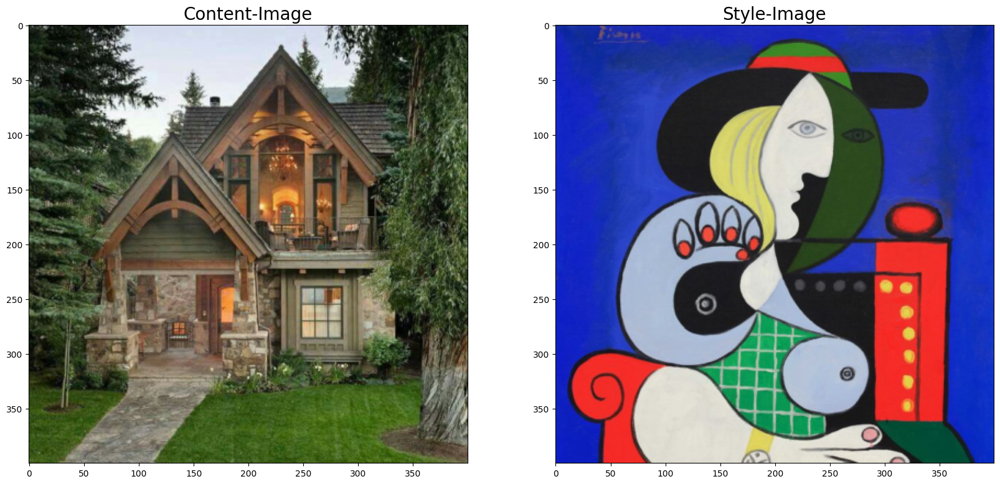

In [29]:
style = load_image("/content/Images/picaso.jpg").to(device)
content  = load_image("/content/Images/house.jpg").to(device)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(convert_image(content))
ax1.set_title("Content-Image",fontsize = 20)
ax2.imshow(convert_image(style))
ax2.set_title("Style-Image", fontsize = 20)

plt.show()

In [ ]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# Gram matrix for every feature layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# Setting the clone/copy of the content image as initial generated image
# This helps in faster convergence
target = content.clone().requires_grad_(True).to(device)

**Hyperparameters:**

Here, we are setting the number of epochs = 7000
*   `α = 0.01` --> Content weight
*   `β = 10^7` --> Style Weight
*   `lr = 0.001` --> Learning Rate


In the paper they have set the weight of each layer as equal to one divided by the number of active layers with a non-zero loss-weight.
This is 0.2 in our case.

In [ ]:
show = 400
epochs = 7000
lr=0.001
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.2,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 0.01 # aplha
style_weight = 1e7 # beta

optimizer = optim.Adam([target], lr=lr)

Total loss:  1638600192.0


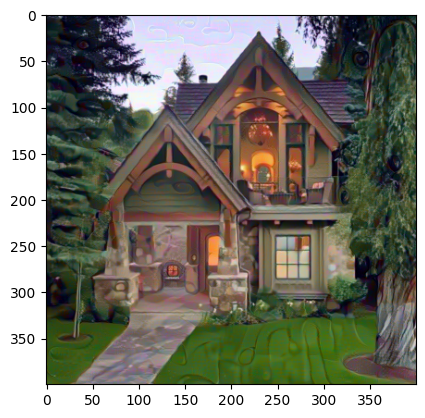

Total loss:  1075559296.0


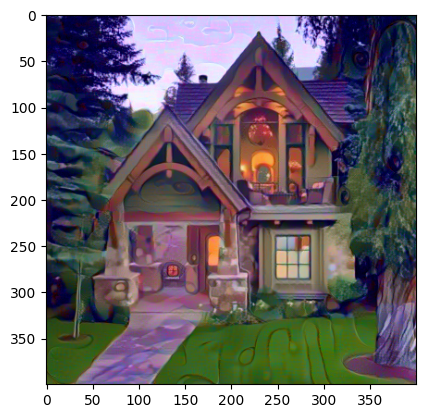

Total loss:  407467488.0


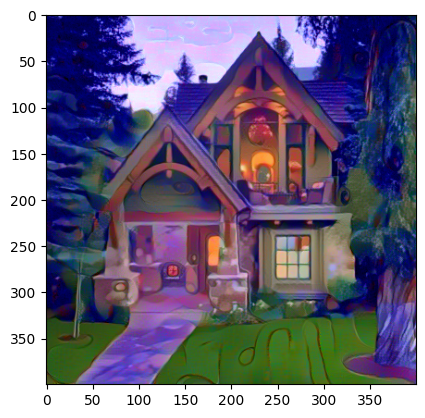

Total loss:  148663120.0


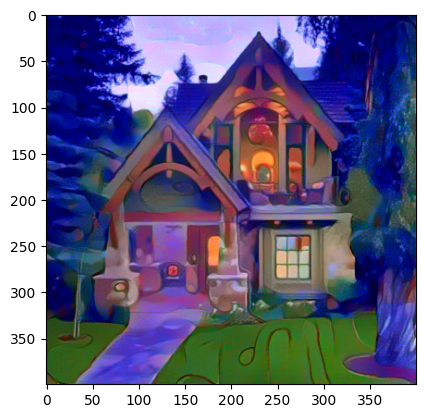

Total loss:  88656480.0


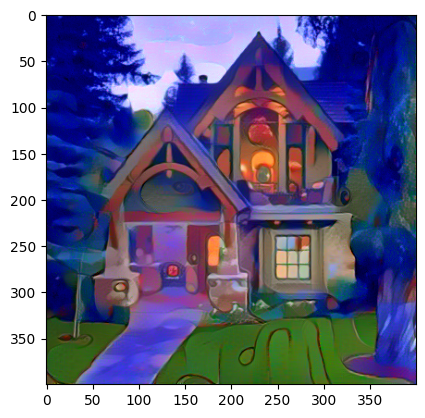

Total loss:  67298232.0


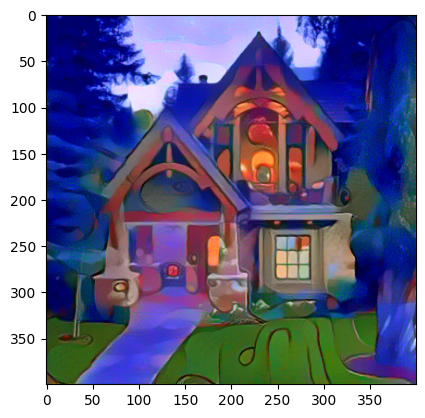

Total loss:  53895200.0


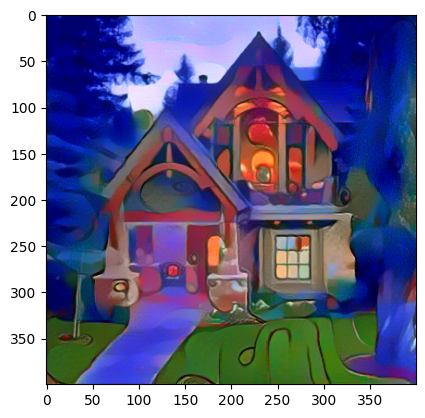

Total loss:  43595028.0


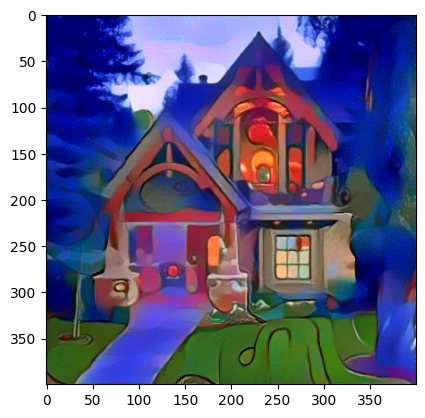

Total loss:  35145244.0


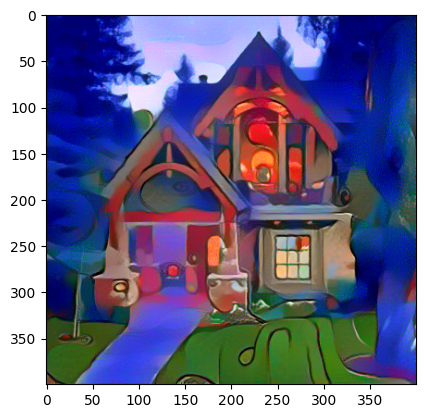

Total loss:  28181420.0


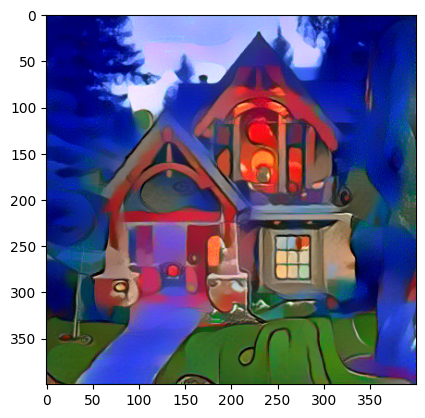

Total loss:  22659008.0


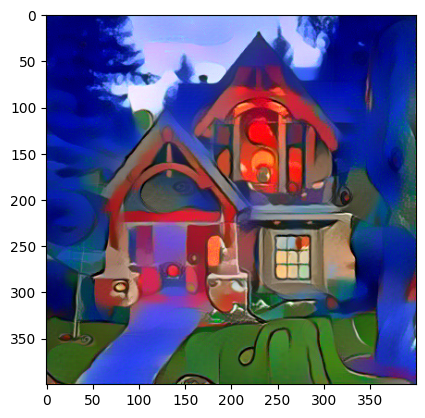

Total loss:  18449356.0


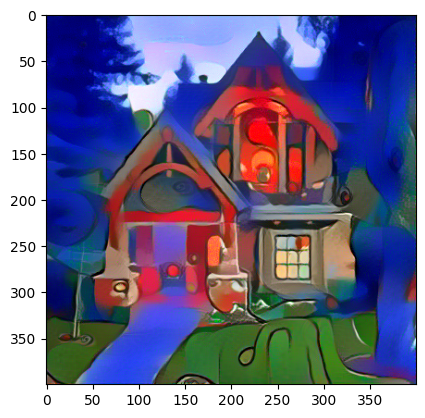

Total loss:  15320050.0


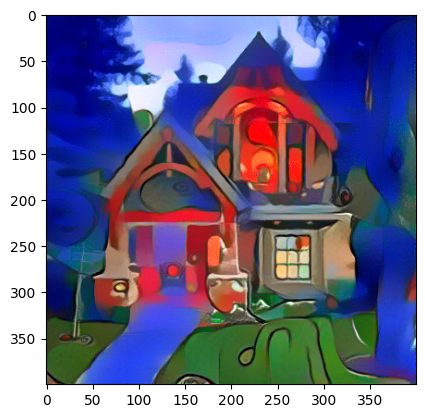

Total loss:  12950218.0


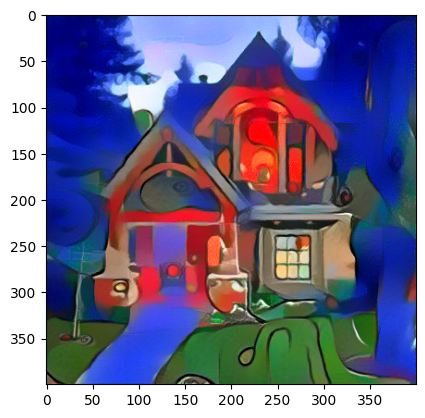

Total loss:  11122526.0


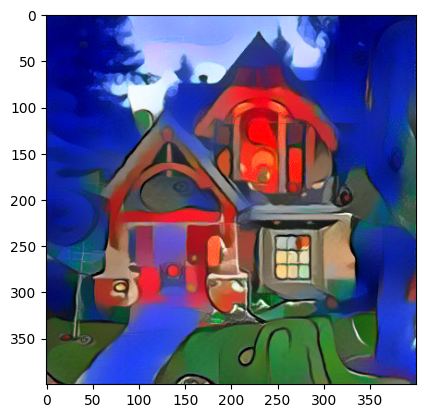

Total loss:  9669963.0


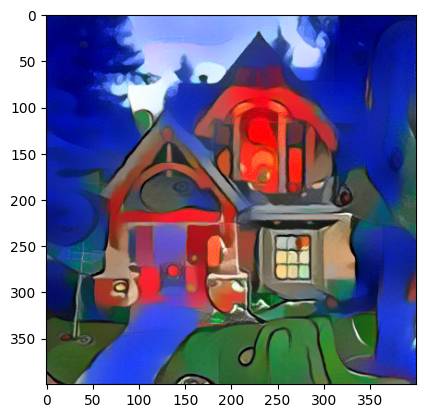

Total loss:  8483273.0


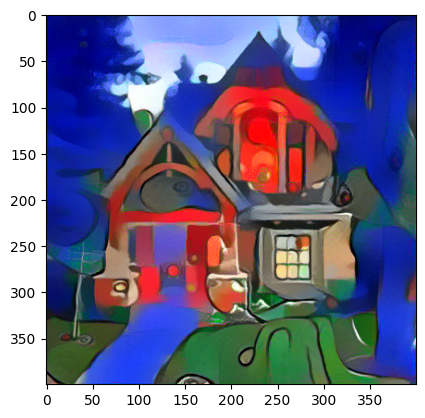

In [28]:
train(style_weights)

## Case-2:

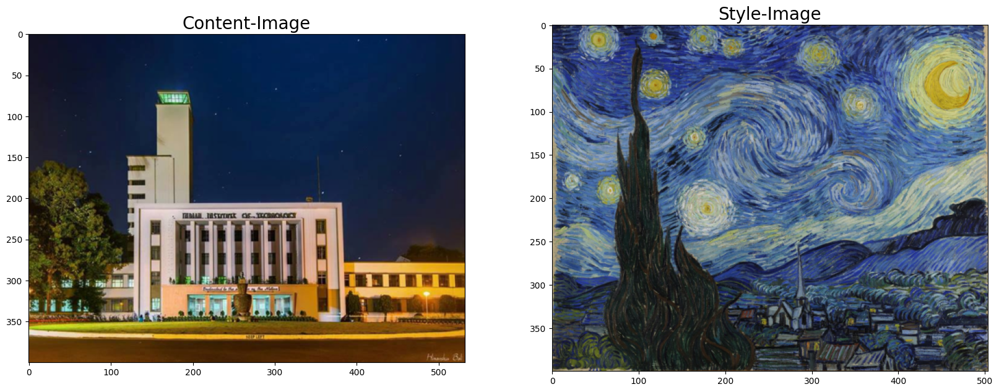

In [33]:
style = load_image("/content/Images/Starry_Night.jpg").to(device)
content  = load_image("/content/Images/IITKGP.jpg").to(device)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(convert_image(content))
ax1.set_title("Content-Image",fontsize = 20)
ax2.imshow(convert_image(style))
ax2.set_title("Style-Image", fontsize = 20)
plt.show()

In [34]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)
vgg.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [35]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# Gram matrix for every feature layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# Setting the clone/copy of the content image as initial generated image
# This helps in faster convergence
target = content.clone().requires_grad_(True).to(device)

In [36]:
show = 400
epochs = 5000
lr=0.001
style_weights = {'conv1_1': 0.8,
                 'conv2_1': 0.5,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 0.01 # aplha
style_weight = 1e7 # beta

optimizer = optim.Adam([target], lr=lr)

Total loss:  300547520.0


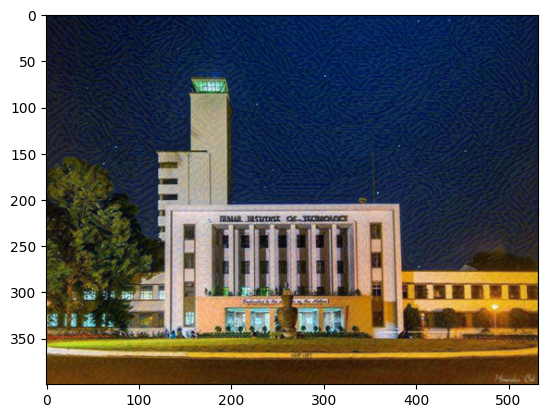

Total loss:  180114656.0


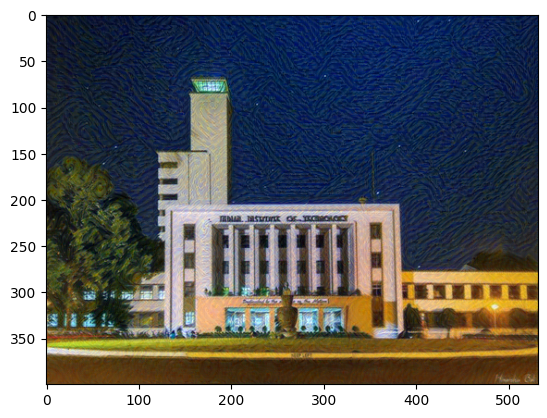

Total loss:  119203304.0


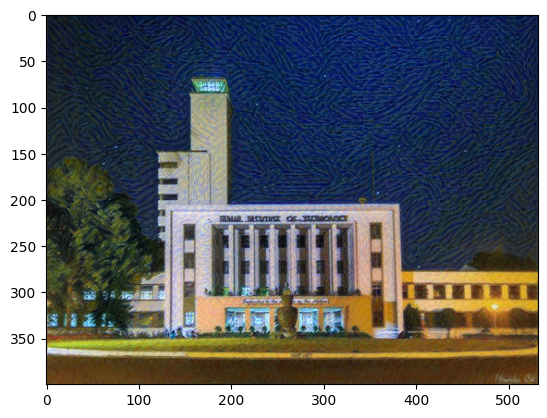

Total loss:  79598352.0


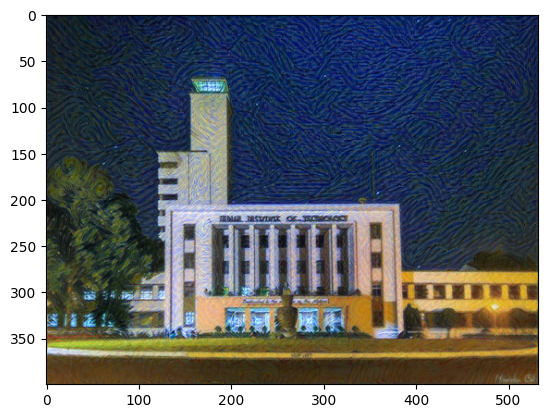

Total loss:  52481588.0


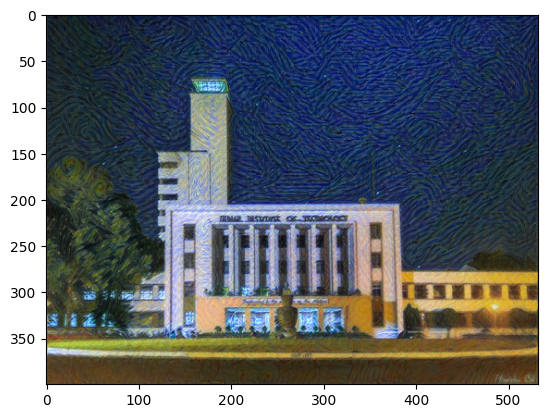

Total loss:  34136808.0


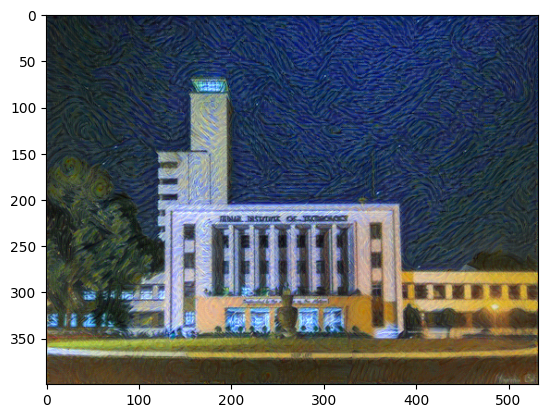

Total loss:  22229000.0


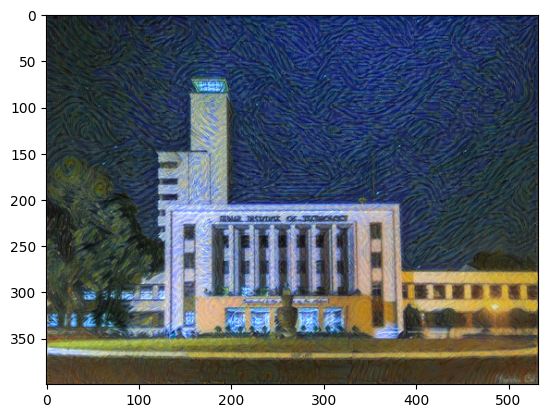

Total loss:  14839333.0


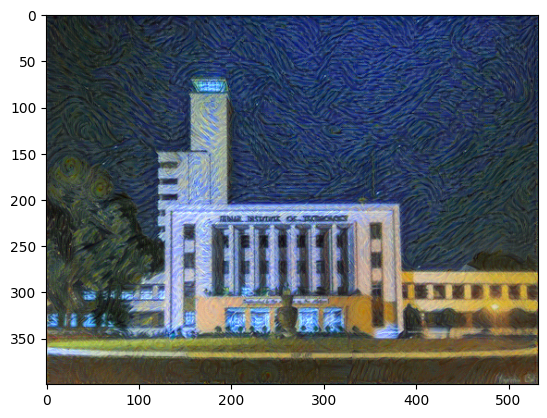

Total loss:  10365455.0


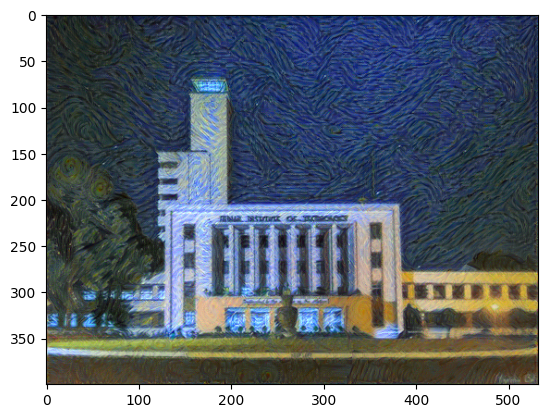

Total loss:  7639276.5


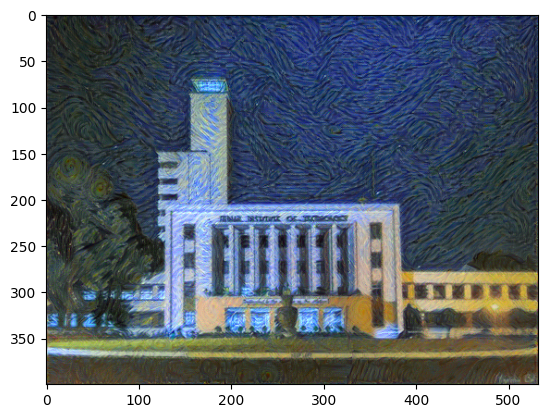

Total loss:  5910410.5


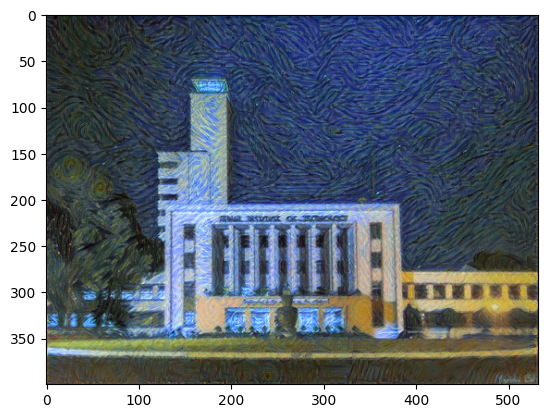

Total loss:  4735320.0


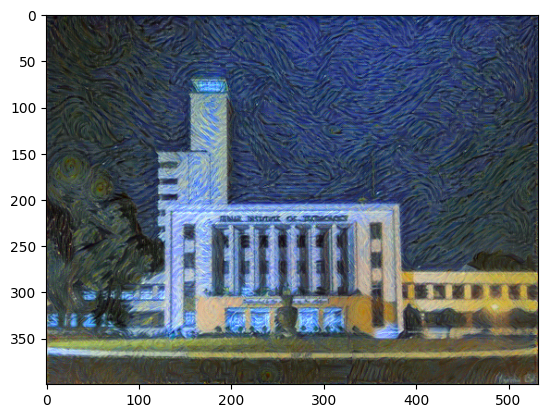

In [37]:
train(style_weights)

# Potential Improvements
* We can use some advanced Neural nets can be used such as Transformer based Neural nets.
* Image segmentation can also be used for the improved styling and for more human eye plausible output.
* Adjusting the hyperparameters like weightage of a layer, alpha and beta can also help in getting more aesthetic images.